<a href="https://colab.research.google.com/github/zoetsouroufli/dsp-24-25/blob/main/project_1_dsp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ΨΗΦΙΑΚΗ ΕΠΕΞΕΡΓΑΣΙΑ ΣΗΜΑΤΩΝ      

**1η ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ**


---



###Τσουρούφλη Ζωή - 03122062  
###Ψυχής Μιχάλης - 03122094


---
**Θέμα:** Εισαγωγή στην Ψηφιακή Επεξεργασία Σημάτων με
Python και Εφαρμογές σε Ακουστικά Σήματα



       





#**Μέρος 1ο - Σύστημα Εντοπισμού Τηλεφωνικών Τόνων (Telephone Touch – Tones)**


In [ ]:
!pip install sounddevice
!apt install libportaudio2

import os
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import IPython
import sounddevice as sd
import soundfile as sf
import librosa
import librosa.display
from scipy.io.wavfile import write
from scipy.signal import find_peaks
from IPython.display import Audio
from scipy.signal import stft
from scipy.signal import butter, lfilter
import scipy.signal as sc



Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  libportaudio2
0 upgraded, 1 newly installed, 0 to remove and 34 not upgraded.
Need to get 65.3 kB of archives.
After this operation, 223 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libportaudio2 amd64 19.6.0-1.1 [65.3 kB]
Fetched 65.3 kB in 0s (320 kB/s)
Selecting previously unselected package libportaudio2:amd64.
(Reading database ... 126102 files and directories currently installed.)
Preparing to unpack .../libportaudio2_19.6.0-1.1_amd64.deb ...
Unpacking libportaudio2:amd64 (19.6.0-1.1) ...
Setting up libportaudio2:amd64 (19.6.0-1.1) ...
Processing triggers for libc-bin (2.35-0ubuntu3.8) ...
/sbin/ldconfig.real: /usr/local/lib/libtbbbind_2_0.so.3 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libumf.so.0 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libtbbb

## Ερώτημα 1.1


---
Θα χρησιμοποιήσουμε τη βιβλιοθήκη numpy. Με δεδομένο μήκος 1000 δείγματα, κατασκευάζουμε 10 διαφορετικά σήματα για τους αντίστοιχους 10 διαφορετικούς τόνους που δίνονται. Για να το πετύχουμε αυτό φτιάχνουμε με την np.arrange() έναν πίνακα με ακεραίους 0-999. Στη συνέχεια δημιουργούμε τα σήματα ως υπέρθεση των αντίστοιχων δύο ημιτόνων με την np.sin(). Λαμβάνουμε υπόψιν μας τη συχνότητα δειγματοληψίας κατά τη χρήση της εντολής Audio για να ακούσουμε τα σήματα που δημιουργήσαμε.



In [ ]:
samples = 1000
sample_rate = 8192
n = np.arange(0,samples)
d = []
d.append(np.sin(0.7217 * n) + np.sin(1.0247 * n))
d.append(np.sin(0.5346 * n) + np.sin(0.9273 * n))
d.append(np.sin(0.5346 * n) + np.sin(1.0247 * n))
d.append(np.sin(0.5346 * n) + np.sin(1.1328 * n))
d.append(np.sin(0.5906 * n) + np.sin(0.9273 * n))
d.append(np.sin(0.5906 * n) + np.sin(1.0247 * n))
d.append(np.sin(0.5906 * n) + np.sin(1.1328 * n))
d.append(np.sin(0.6535 * n) + np.sin(0.9273 * n))
d.append(np.sin(0.6535 * n) + np.sin(1.0247 * n))
d.append(np.sin(0.6535 * n) + np.sin(1.1328 * n))
IPython.display.Audio(d[0], rate=sample_rate)

ΠΑΡΑΤΗΡΗΣΗ: Για τη συχνοτητα δειγματοληψίας check !

## Eρώτημα 1.2


---
Με την εντολή np.fft.fft() υπολογίζουμε τον DFT και επιλέγουμε μάλιστα τον αριθμό των σημείων. Προκειμένου να εμφανίσουμε τη γραφική παράσταση των σημάτων ορίζουμε το omega, το οποίο είναι το φάσμα συχνοτήτων για τον άξονα x. Αποτελείται από 1024 σημεία με απόσταση του καθενός μεταξύ τους 1/2π. Στη συνέχεια με την εντολή np.plot() εμφανίζουμε τα DFT των σημάτων και μάλιστα το μέτρο αυτών (np.abs()).



Text(0.5, 1.0, 'DFT of sinusoid')

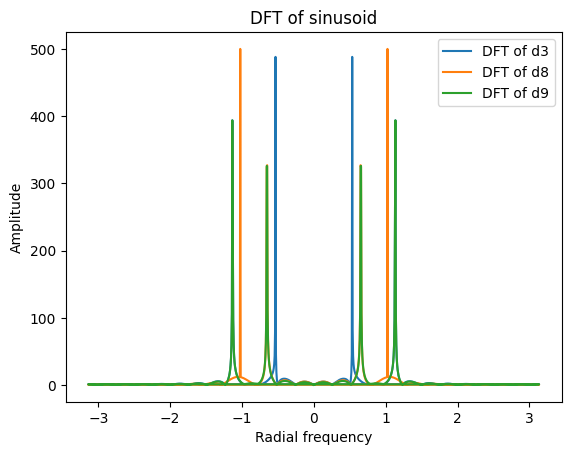

In [ ]:
y_3 = np.fft.fft(d[3], 1024)
y_8 = np.fft.fft(d[8], 1024)
y_9 = np.fft.fft(d[9], 1024)
omega = np.fft.fftfreq(1024, 1/(2*np.pi))
plt.plot(omega,np.abs(y_3))
plt.plot(omega,np.abs(y_8))
plt.plot(omega,np.abs(y_9))
plt
plt.legend(['DFT of d3','DFT of d8','DFT of d9'])
plt.ylabel('Amplitude')
plt.xlabel('Radial frequency')
plt.title('DFT of sinusoid')


Πράγματι βλέπουμε ότι τα γραφήματα έχουν άρτια συμμετρία ,κάτι επιθυμητό μετά από τον DFT. Παρατηρούμε επίσης, ότι οι γραφικές παραστάσεις των d8 και d9 έχουν κοινή χαμηλή συχνότητα και για αυτό φαίνεται μόνο η d9. Αυτό ήταν αναμενόμενο, αφού από τις διακριτές συχνότητες ξέρουμε ότι τα σήματα d8, d9 έχουν κοινή Ωrow, που είναι η χαμηλή συχνότητα των τόνων. Αντίστοιχα, παρατηρούμε ότι τα σήματα d3, d9 έχουν κοινή την υψηλή συχνότητα.

## Ερώτημα 1.3


---

Σήμα που πρέπει να αποθηκεύσουμε:
*03122094* + 03122062 = 03122196
Για να δημιουργήσουμε το ζητούμενο σήμα ορίζουμε έναν buffer με 100 μηδενικά με την εντολή np.zeros(). Επίσης δημιουργούμε το σήμα με τους ζητούμενους τόνους (message) και έναν πίνακα buffed_message, στο οποίο θα τοποθετήσουμε το message με τα μηδενικά ενδιάμεσα για να διακρίνονται καλύτερα οι τόνοι. Αυτό το πετυχαίνουμε με την εντολή np.concatenate() συνενώνουμε τους πίνακες των σημάτων που αντιστοιχούν στο ζητούμενο κάθε φορά ψηφίο και του buffer. Με την εντολή write της βιβλιοθήκης soundfile αποθηκεύουμε το νέο σήμα στο αρχείο .wav.


In [ ]:
buffer = np.zeros(100)
message = [d[0], d[3], d[1], d[2], d[2], d[1], d[9], d[6]]
buffed_message = []
buffed_message = np.concatenate((buffed_message, message[0]))
for m in message[1:]:
  buffed_message = np.concatenate((buffed_message, buffer, m))

write('users_coded_signal_03122196.wav', sample_rate, buffed_message.astype(np.float32))

## Ερώτημα 1.4


---
Φτιάχνουμε δύο παράθυρα ένα hamming και ενα rectangular μήκους 1000, με τις εντολές np.hamming() και np.ones() αντίστοιχα. Πολλαπλασιάζουμε τους διαφορετικούς τόνους του message που δημιουργήσαμε στο 1.3 με το αντίστοιχο κάθε φορά παράθυρο. Αποθηκεύουμε τα παραθυροποιήμενα σήματα σε έναν πίνακα για κάθε ένα window. Στη συνέχεια εκτελούμε fft (Ν=1024) για το hamming και το rectangular signal και πλοτάρουμε όπως στα από πάνω ερωτήματα.

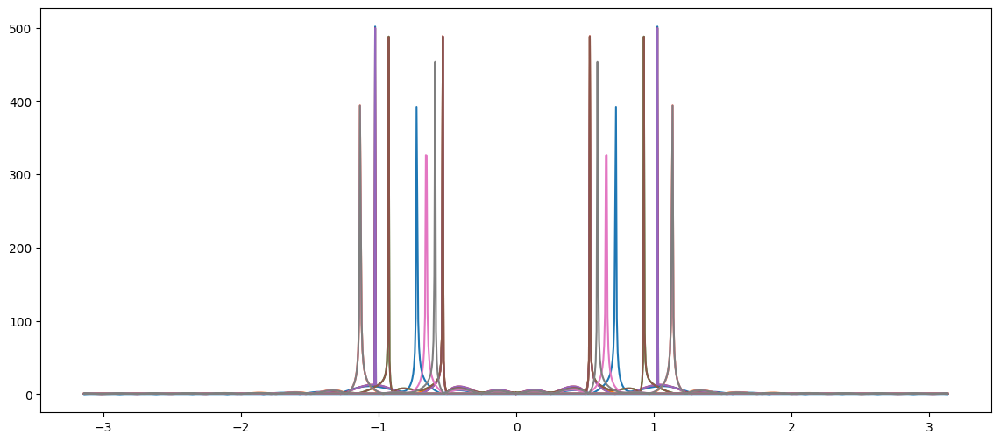

In [ ]:
hamming = np.hamming(1000)
rectangular = np.ones(1000)

rectangular_signal = []
hamming_signal = []

fig = plt.subplots(figsize=(14, 6))

for signal in message :
  rectangular_signal.append(signal * rectangular)
  hamming_signal.append(signal * hamming)

fft_rect = []
for signal in rectangular_signal:
  fft = np.abs(np.fft.fft(signal, 1024))
  fft_rect.append(fft)
  plt.plot(omega, np.abs(fft))

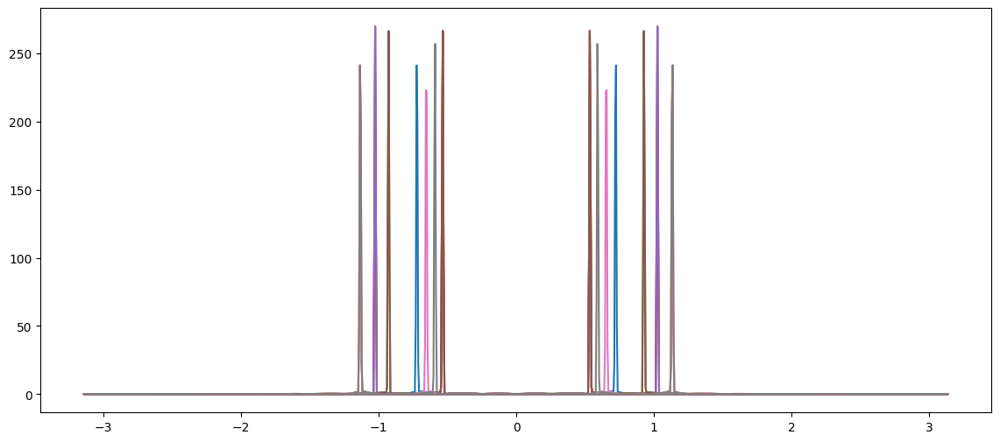

In [ ]:
fig = plt.subplots(figsize=(14, 6))
fft_hamm = []
for signal in hamming_signal:
  fft = np.abs(np.fft.fft(signal, 1024))
  fft_hamm.append(fft)
  plt.plot(omega, fft)

## Ερώτημα 1.5


---

Μας ζητείται να βρούμε τους δείκτες k και τις αντίστοιχες συχνότητες που βρίσκονται κοντά στισ touch-tone συχνότητες. Αρχικά εκτελούμε DFT για όλους τα αρχικά μας σήματα. Στη συνέχεια κατανέμουμε με την εντολή np.argsort() τους δείκτες με βάση το πλάτος τουες και κρατάμε αυτούς με τισ 4 μεγαλύτερες τιμές. Χρειαζόμαστε τους 4 τελευταίους γιατί το κάθε σήμα μας έχει δύο τόνους άρα δύο μέγιστες τιμές και λαμβάνουμε υπόψη και τις συμμετρικές τιμές αυτών. Στον πίνακα τελικά αποθηκεύουμε τους 2 από τους 4 δείκτες (συμμετρία). Με τη χρήση της omega αντιστοιχίζουμε τους δείκτες που βρήκαμε στις αντίστοιχες συχνότητες. Για το σήμα 0, βλέπουμε ότι οι συχνότητες που προκύπτουν ταυτίζονται σχεδόν πλήρως με τις touch tone συχνότητες των τόνων (0.724 και 1.024), με ελάχιστες αποκλίσεις.

[118 167]
[ 87 151]
[ 87 167]
[ 87 185]
[ 96 151]
[ 96 167]
[ 96 185]
[107 151]
[106 167]
[107 185]
[[np.int64(118), np.float64(0.7240389318820226), np.int64(167), np.float64(1.0246991663076084)], [np.int64(87), np.float64(0.5338253141842031), np.int64(151), np.float64(0.9265243958829272)], [np.int64(87), np.float64(0.5338253141842031), np.int64(167), np.float64(1.0246991663076084)], [np.int64(87), np.float64(0.5338253141842031), np.int64(185), np.float64(1.1351457830353744)], [np.int64(96), np.float64(0.5890486225480862), np.int64(151), np.float64(0.9265243958829272)], [np.int64(96), np.float64(0.5890486225480862), np.int64(167), np.float64(1.0246991663076084)], [np.int64(96), np.float64(0.5890486225480862), np.int64(185), np.float64(1.1351457830353744)], [np.int64(107), np.float64(0.6565437772150544), np.int64(151), np.float64(0.9265243958829272)], [np.int64(106), np.float64(0.6504078540635119), np.int64(167), np.float64(1.0246991663076084)], [np.int64(107), np.float64(0.656543777215

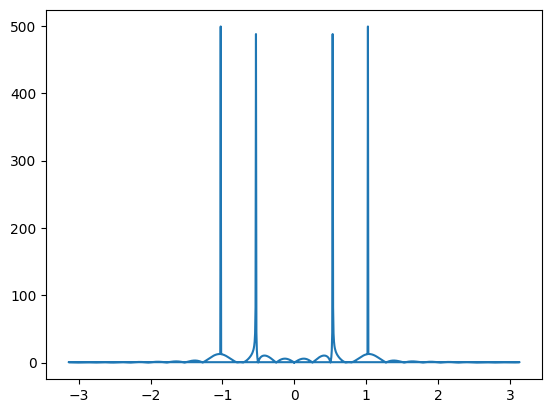

In [ ]:
peaks = []
fft_of_all_signals = []

for signal in d:
  fft_of_all_signals.append(np.abs(np.fft.fft(signal, 1024)))

for signal in fft_of_all_signals:
  peak = np.sort(np.argsort(signal)[-4:])[:2]
  print(peak)
  peaks.append([peak[0], omega[peak[0]], peak[1], omega[peak[1]]])

print(peaks)
plt.plot(omega, np.abs(fft_rect[3]))

## Ερώτημα 1.6


---
Αρχικά ορίζουμε με τη size_of πόσους τόνους έχει το σήμα μας (κάθε τόνος αποτελείται απο 1000 samples). Φτιάχνουμε δύο πίνακες (button_low_known, button_high_known) έναν για τισ γνωστές χαμηλές διακριτές συχνότητες και μία για τις υψηλές (Ωrow, Ωcolumn). Φτιάχνουμε και ένα map για να αποθηκεύσουμε τον συνδυασμό των τόνων που αποτελούν το κάθε σήμα. Αποθηκεύουμε στον πίνακα signals, τα διαφορετικά σήματα 1000 samples του συνολικού σήματος εισόδου, τα οποία θα πρέπει να αντιστοιχήσουμε στους τηλεφωνικούς τόνους. Στα διαφορετικά αυτά σήματα κάνουμε fft και βρίσκουμε την ενέργειά τους. Στη συνέχεια, βρίσκουμε με αντίστοιχο τρόπο με το προηγούμενο ερώτημα τα δύο μέγιστα του κάθε σήματος και τα αποθηκέυουμε στους πίνακες button_low και button_high τους οποίους στη συνέχεια θα συγκρίνουμε με τους button_high_known και button_low_known. Mέχρι το σημείο αυτό λοιπόν γνωρίζουμε τις δύο συχνότητες που αντιστοιχούν στους δύο τόνους από τους οποίους αποτελείται το κάθε σήμα. Για να αντιστοιχήσουμε τις συχνότητες αυτές στις δεδομένες διακριτές και έπειτα στους αρχικούς μας τόνους, κρατάμε κάθε φορά την διακριτή συχνότητα που απέχει λιγότερο από αυτή που υπολογίσαμε και με τη βοήθεια του key_map κάνουμε τελικά την αντιστοίχιση.


In [ ]:
def ttdecode(message):
  size_of = (len(message)+100)/1100
  signals = []
  fft_signal = []
  energy = []
  button_low = []
  button_high = []
  button_low_known = [0.5346, 0.5906, 0.6535, 0.7217]
  button_high_known = [0.9273, 1.0247, 1.1328]
  final_output = []

  key_map = {
      (0,0): 1,
      (0,1): 2,
      (0,2): 3,
      (1,0): 4,
      (1,1): 5,
      (1,2): 6,
      (2,0): 7,
      (2,1): 8,
      (2,2): 9,
      (3,1): 0
  }

  for i in range(int(size_of)):
    signals.append(message[1100*i:(1100*i+1000)])

  for signal in signals:
    fft = np.abs(np.fft.fft(signal, 1024))
    fft_signal.append(fft)
    energy.append(fft*fft)

  for signal in energy:
    peak = np.sort(np.argsort(signal)[-4:])[:2]
    button_low.append(omega[peak[0]])
    button_high.append(omega[peak[1]])

  for i in range(int(size_of)):
    index_low = np.argmin(np.abs(button_low_known - button_low[i]))
    index_high = np.argmin(np.abs(button_high_known - button_high[i]))
    final_output.append(key_map[(index_low, index_high)])

  return final_output
print(ttdecode(buffed_message))


[0, 3, 1, 2, 2, 1, 9, 6]


## Ερώτημα 1.7


---
Με τη χρήση της np.load() φορτώνουμε τα 3 αρχεία easy_sig, medium_sig και hard_sig και στη συνέχεια με χρήση της συνάρτησης που φτιάξαμε στο 1.6 προσδιορίζουμε τα ψηφία στα οποία αντιστοιχούν οι τόνοι.


In [ ]:
easy=np.load("easy_sig.npy")
medium=np.load("medium_sig.npy")
hard=np.load("hard_sig.npy")

print("easy is:", ttdecode(easy))
print("medium is:", ttdecode(medium))
print("hard is:", ttdecode(hard))

IPython.display.Audio(easy, rate=sample_rate)


easy is: [2, 0, 1, 3, 6, 5, 1, 5]


# **Μέρος 2ο - Χαρακτηριστικά Βραχέος Χρόνου Σημάτων Φωνής και Μουσικής**

##Ερώτημα 2.1


---
Με χρήση της βιβλιοθήκης soundfile διαβάζουμε το σήμα speech_utterance.wav και το αποθηκεύουμε. Θέλουμε να αναπαραστήσουμε το σήμα στο πεδίο του χρόνου και άρα θέλουμε ο άξονας της τετμημένης να ξεκινάει από το 0 έως το (μήκος του σήματος μας)/(τη συχνότητα δειγματοληψίας). Το κανονικοποιημένο σήμα φαίνεται παρακάτω:


Text(0.5, 1.0, '"Oh mother, I saw them" - soundwave')

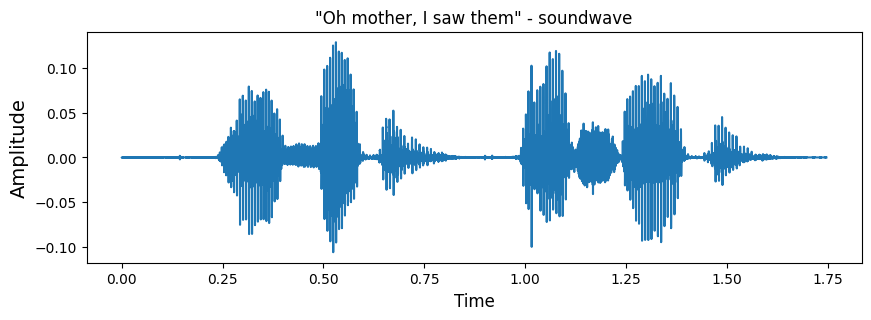

In [ ]:
sample_rate = 16000
mother, sample_rate = sf.read('speech_utterance.wav')
time=np.linspace(0, len(mother)/sample_rate, len(mother))

normalised_mother=mother/np.max(np.abs(mother))

fig = plt.subplots(figsize=(10, 3))

plt.plot(time,mother)
plt.ylabel('Amplitude', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.title('"Oh mother, I saw them" - soundwave', fontsize=12)




## Ερώτημα 2.2

### Ενέργεια βραχέος χρόνου:
---

Θέλουμε να υπολογίσουμε την Ενέργεια του Σήματος mother, συναρτήσει του χρόνου.

Η ενέργεια βραχέος χρόνου που ορίζεται ως:$E[n] = \sum_{m=-\infty}^{\infty} |x[m]|^2 w[n - m]$  όπου w ένα παράθυρο της επιλογής μας. Εμείς επιλέγουμε το Hamming παράθυρο (συνάρτηση **hamming()** στη numpy). Για το πλάτος αυτού του παραθύρου επιλέγουμε τιμές: 20ms, 30ms, 40ms, 50ms. Η συνέλιξη δίνεται έτοιμη από την βιβλιοθήκη της numpy, με την εντολή **np.convolve()**.
Στο τέλος κανονικοποιήσαμε το σήμα ενέργειας και το εμφανίζουμε μαζί με το κανονικοποιημένο αρχικό σήμα.


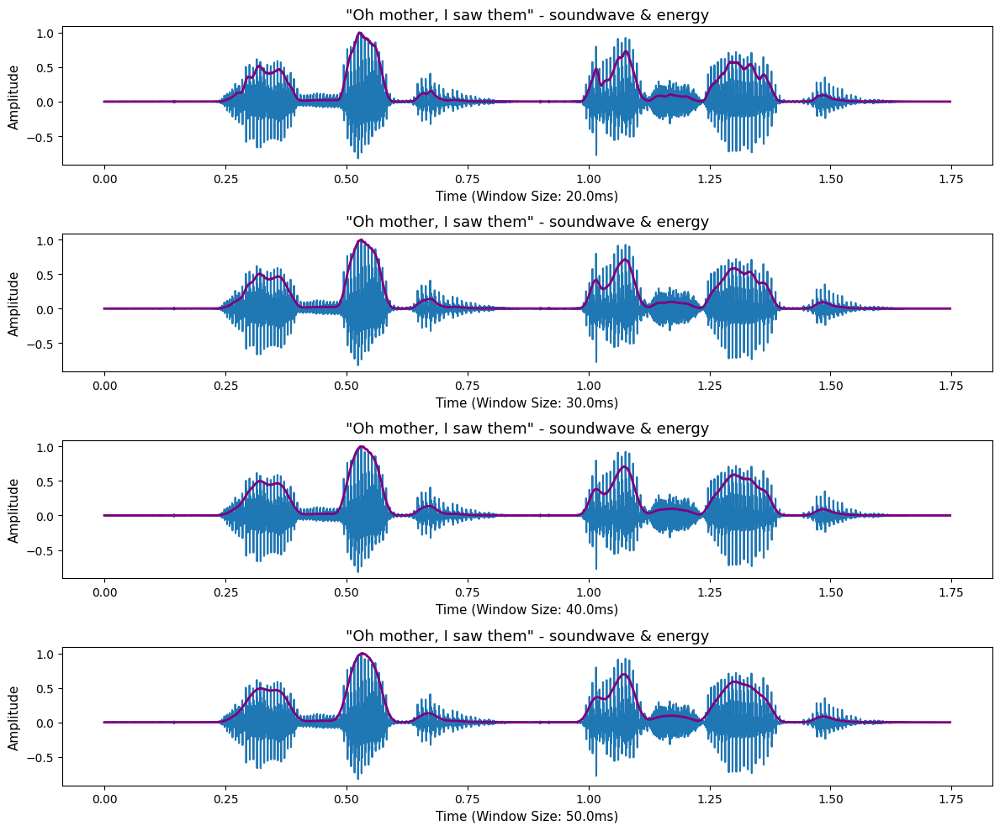

In [ ]:
window_size = [0.02, 0.03, 0.04, 0.05]
mother_squared = mother*mother
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(12, 10))

for size in window_size:
  hamming = np.hamming(size*sample_rate) # Η δημιουργία του hamming παραθύρου
  energy = []

  energy = np.convolve(mother_squared, hamming, mode='same') # Η συνέλιξη
  normalised_energy = energy / np.max(abs(energy)) # Η κανονικοποίηση


  axs[window_size.index(size)].plot(time, normalised_mother)
  axs[window_size.index(size)].plot(time, normalised_energy, color="purple", linewidth=2)
  #Μορφοποιήσεις
  axs[window_size.index(size)].set_title('"Oh mother, I saw them" - soundwave & energy', fontsize=13)
  axs[window_size.index(size)].set_ylabel('Amplitude', fontsize=11)
  axs[window_size.index(size)].set_xlabel(f'Time (Window Size: {size*1000}ms)', fontsize=11)
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()



Παρατηρούμε ότι όσο μεγαλύτερο είναι το παράθυρο hammimg, τόσο πιο ομαλό είναι το γράφημα της Ενέργειας. Αυτό είναι λογικό διότι απότομες αλλαγές του σήματος εισόδου, έχουν μικρότερο "βάρος" (άρα και αποτύπωση) στο γράφημα της ενέργειας, όταν έχουμε μεγαλύτερο παράθυρο. Στην δικιά μας εφαρμογή τα 20ms είναι ικανοποιητικά.

### Zero Crossing Rate:
---

Θέλουμε να υπολογίσουμε το Zero Crossing Rate του Σήματος mother, συναρτήσει του χρόνου.

Το ZCR που ορίζεται ως:$E[n] = \sum_{m=-\infty}^{\infty} |x[m]|^2 w[n - m]$  όπου w ένα παράθυρο της επιλογής μας. Εμείς επιλέγουμε το Hamming παράθυρο (συνάρτηση **hamming()** στη numpy). Για το πλάτος αυτού του παραθύρου επιλέγουμε τιμές: 20ms, 30ms, 40ms, 50ms. Η συνέλιξη δίνεται έτοιμη από την βιβλιοθήκη της numpy, με την εντολή **np.convolve()**.
Στο τέλος κανονικοποιήσαμε το σήμα ενέργειας και το εμφανίζουμε μαζί με το κανονικοποιημένο αρχικό σήμα.



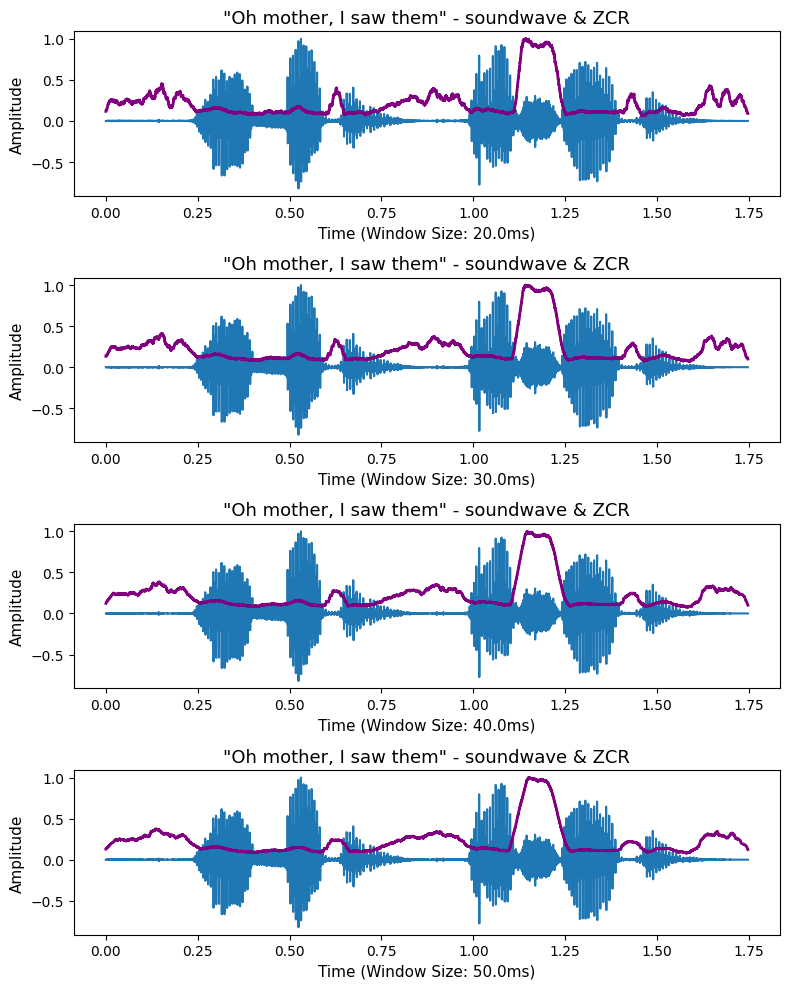

In [ ]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(8, 10))

for size in window_size:
  i = window_size.index(size)
  rect = np.full(int(size*sample_rate), 1/(2*size*sample_rate))
  zcr = []
  mother_sign = []
  prev = 0

  for m in mother:
    mother_sign.append(np.abs(np.sign(m) - np.sign(prev)))
    prev = m

  zcr = np.convolve(mother_sign, rect, mode='same')
  zcr_normalised = zcr / np.max(abs(zcr))

  axs[i].plot(time, normalised_mother)
  axs[i].set_title('"Oh mother, I saw them" - soundwave & ZCR', fontsize=13)
  axs[i].plot(time, zcr_normalised, color="purple", linewidth=2)
  axs[i].set_ylabel('Amplitude', fontsize=11)
  axs[i].set_xlabel(f'Time (Window Size: {size*1000}ms)', fontsize=11)
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()


2.3

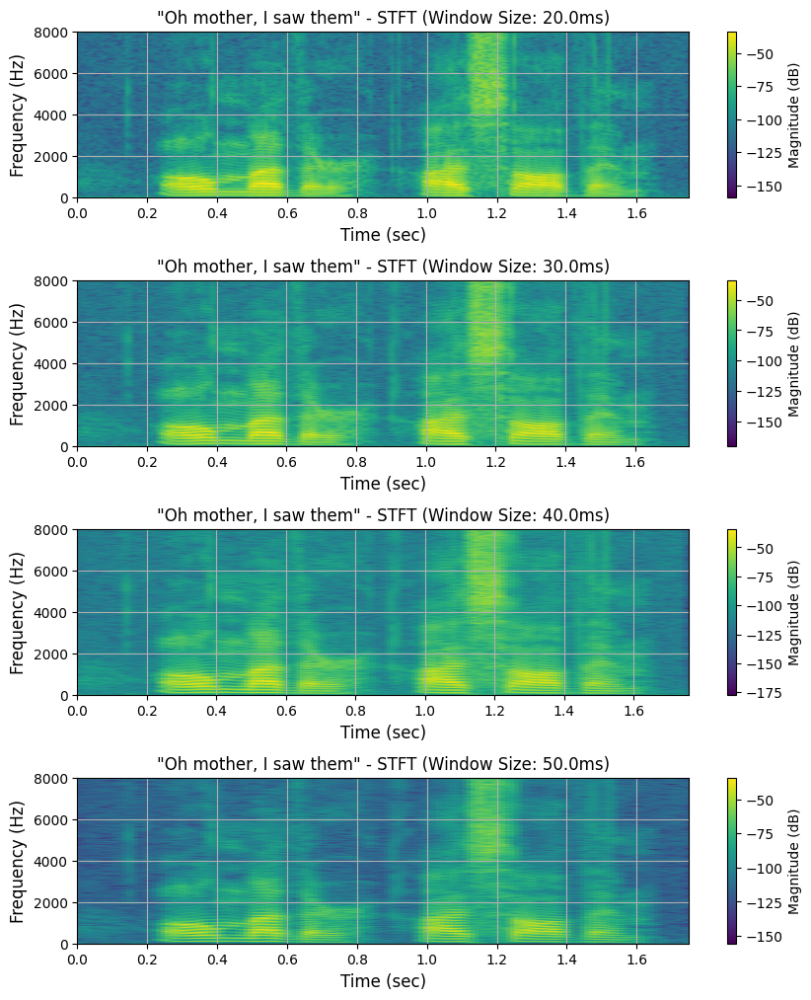

In [ ]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(10, 12))
f = []
t = []
Zxx = []

for size in window_size:
  i = window_size.index(size)
  #Creation and Plotting of STFT
  f1, t1, Zxx1 = stft(mother, sample_rate, nperseg=sample_rate*size, nfft=2048) # The stft of the signal
  f.append(f1)
  t.append(t1)
  Zxx.append(Zxx1)
  mesh = axs[i].pcolormesh(t1,f1, 20*np.log10(np.abs(Zxx1 + 0.00000001)), shading='gouraud')

  #visualisation settings
  cbar = fig.colorbar(mesh, ax=axs[window_size.index(size)])
  cbar.set_label('Magnitude (dB)')  # Set the label for the colorbar
  axs[i].set_title(f'"Oh mother, I saw them" - STFT (Window Size: {size*1000}ms)', fontsize=12)
  axs[i].set_ylabel('Frequency (Hz)', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  plt.subplots_adjust(hspace=0.5)
  plt.tight_layout()

ΦΑΣΜΑΤΙΚΟ ΚΕΝΤΡΟ

<ipython-input-165-e884dff68c3c>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[i].legend()


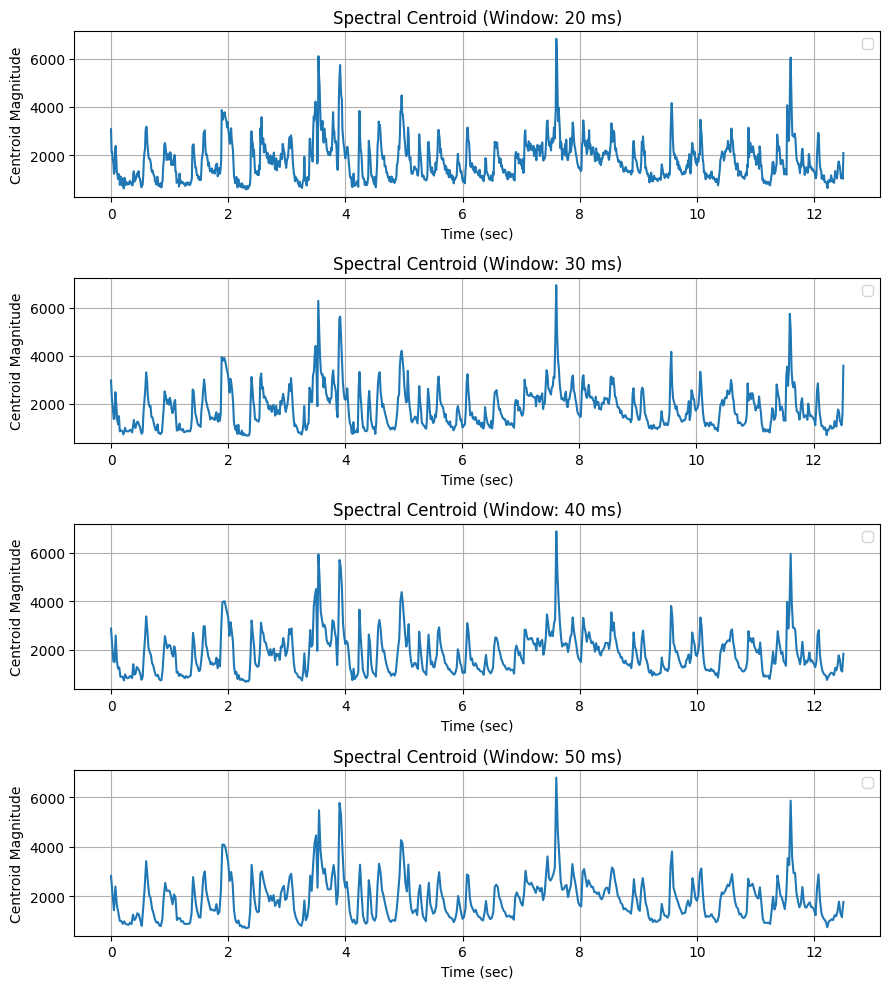

In [ ]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(9, 10))

def spectral_centroid(z, f):
    return np.sum(f * np.abs(z).T, axis = 1) / np.sum(np.abs(z).T, axis = 1)

spec_cent = []

for size in window_size:
    i = window_size.index(size)
    spec_cent.append(spectral_centroid(Zxx[i], f[i]))
    axs[i].plot(t[i], spec_cent[i])
    axs[i].set_title(f'Spectral Centroid (Window: {size*1000:.0f} ms)', fontsize = 12)
    axs[i].set_ylabel('Centroid Magnitude', fontsize=10)
    axs[i].set_xlabel('Time (sec)', fontsize=10)
    axs[i].grid()
    axs[i].legend()
    plt.subplots_adjust(hspace=0.5)
    plt.tight_layout()



CENTROID ΚΑΙ ΣΠΕΚΤΟΓΛΡΑΜ ΜΑΖΙ

/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


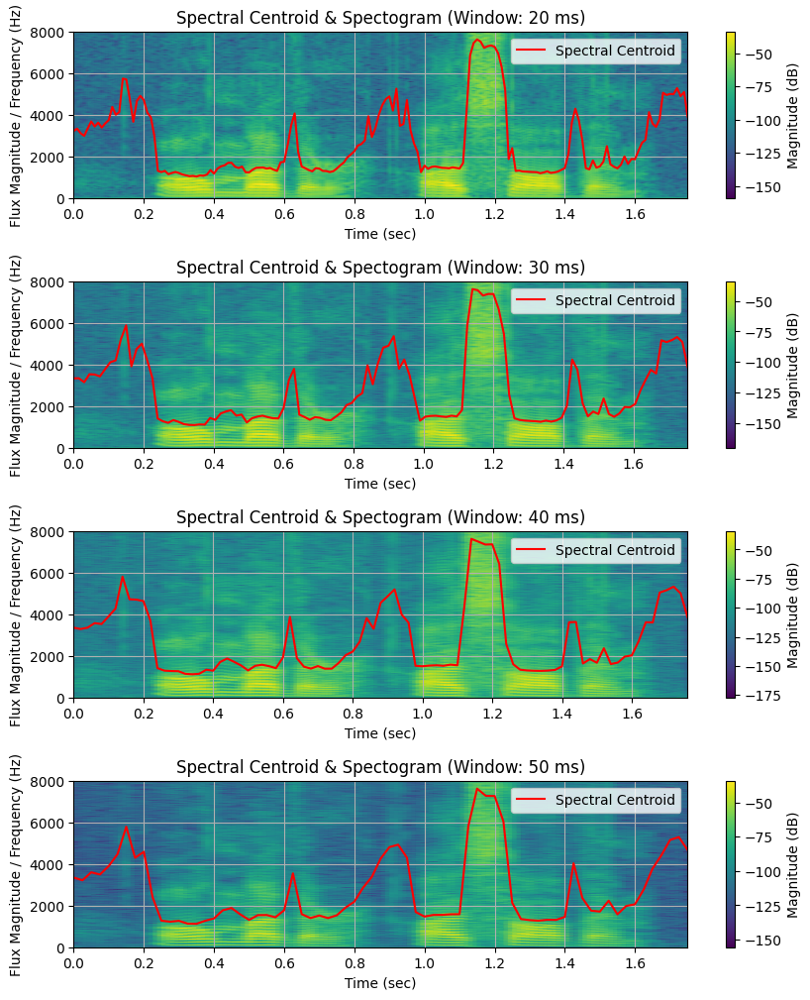

In [ ]:
#ΦΑΣΜΑΤΙΚΟ CENTROID ME SPECTOGRAM
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(10, 12))

for size in window_size:
  # Indexing
  i = window_size.index(size)

  mesh = axs[i].pcolormesh(t[i], f[i], 20*np.log10(np.abs(Zxx[i] + 0.00000001)), shading='gouraud')
  cbar = fig.colorbar(mesh, ax=axs[i])
  cbar.set_label('Magnitude (dB)')

  # Spectral Flux Οπτικοποίηση
  norm_centroid = spec_cent[i] / (1.05*np.max(spec_cent[i]))  # Κανονικοποίηση
  axs[i].plot(t[i], 8000*norm_centroid, color='r', label='Spectral Centroid')
  axs[i].set_title(f'Spectral Centroid & Spectogram (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i].set_ylabel('Flux Magnitude / Frequency (Hz)', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  axs[i].legend()
  plt.subplots_adjust(hspace=0.5)
  plt.tight_layout()

ΦΑΣΜΑΤΙΚΗ ΡΟΗ

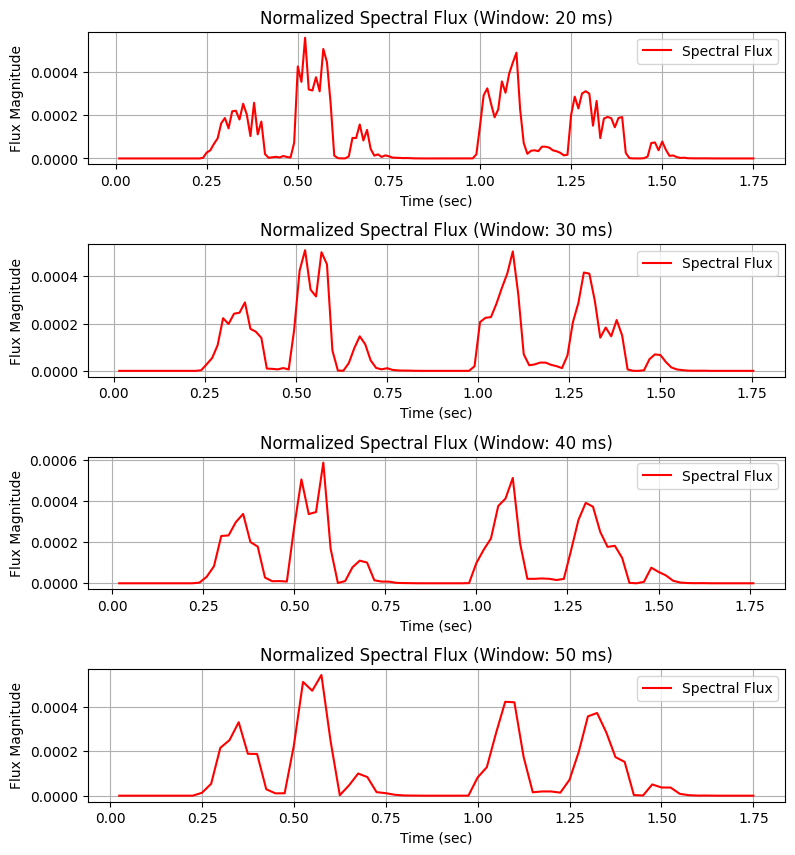

In [ ]:
#ΦΑΣΜΑΤΙΚΗ ΡΟΗ/FLUX ΜΟΝΗ ΤΗΣ
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(9, 10))

flux = []

for size in window_size:
  # Indexing
  i = window_size.index(size)
  # Υπολογισμός φασματικής ροής
  power_spec = np.abs(Zxx[i]) ** 2  # Υπολογισμός φασματικής ενέργειας
  flux.append(np.linalg.norm(power_spec[:, 1:] - power_spec[:, :-1], axis=0))  # Ευκλείδεια απόσταση

  # Spectral Flux Οπτικοποίηση
  axs[i].plot(t[i][1:], flux[i], color='r', label='Spectral Flux')
  axs[i].set_title(f'Normalized Spectral Flux (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i].set_ylabel('Flux Magnitude', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  axs[i].legend()
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()



In [ ]:
#ΦΑΣΜΑΤΙΚΗ ΡΟΗ/FLUX ME SPECTOGRAM
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(10, 12))

for size in window_size:
  # Indexing
  i = window_size.index(size)

  mesh = axs[i].pcolormesh(t[i], f[i], 20*np.log10(np.abs(Zxx[i] + 0.00000001)), shading='gouraud')
  cbar = fig.colorbar(mesh, ax=axs[i])
  cbar.set_label('Magnitude (dB)')

  # Spectral Flux Οπτικοποίηση
  norm_flux = flux[i] / (1.05*np.max(flux[i]))  # Κανονικοποίηση
  axs[i].plot(t[i][1:], 8000*norm_flux, color='r', label='Spectral Flux')
  axs[i].set_title(f'Normalized Spectral Flux & Spectogram (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i].set_ylabel('Flux Magnitude / Frequency (Hz)', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  axs[i].legend()
  plt.subplots_adjust(hspace=0.5)
  plt.tight_layout()

<ipython-input-175-d597285b8237>:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


2.4 MUSIC

(2.1)

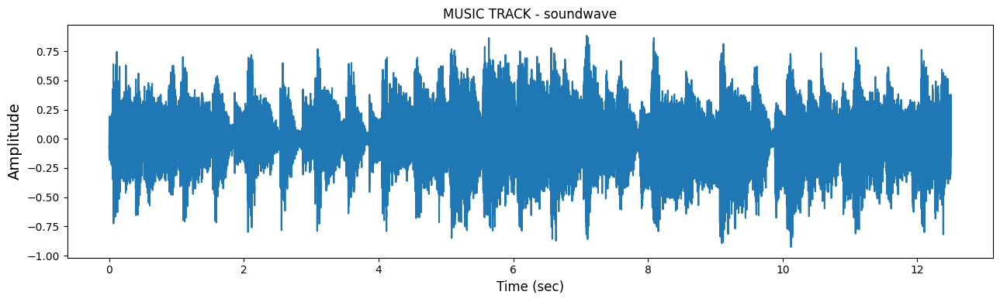

In [ ]:
sample_rate = 48000
music, sample_rate = sf.read('music.wav')
time = np.linspace(0, len(music)/sample_rate, len(music))

normalised_music = music/np.max(np.abs(music))

fig = plt.subplots(figsize=(13, 4))

plt.plot(time,music)
plt.ylabel('Amplitude', fontsize=14)
plt.xlabel('Time (sec)', fontsize=12)
plt.title('MUSIC TRACK - soundwave', fontsize=12)
plt.tight_layout()

2.2

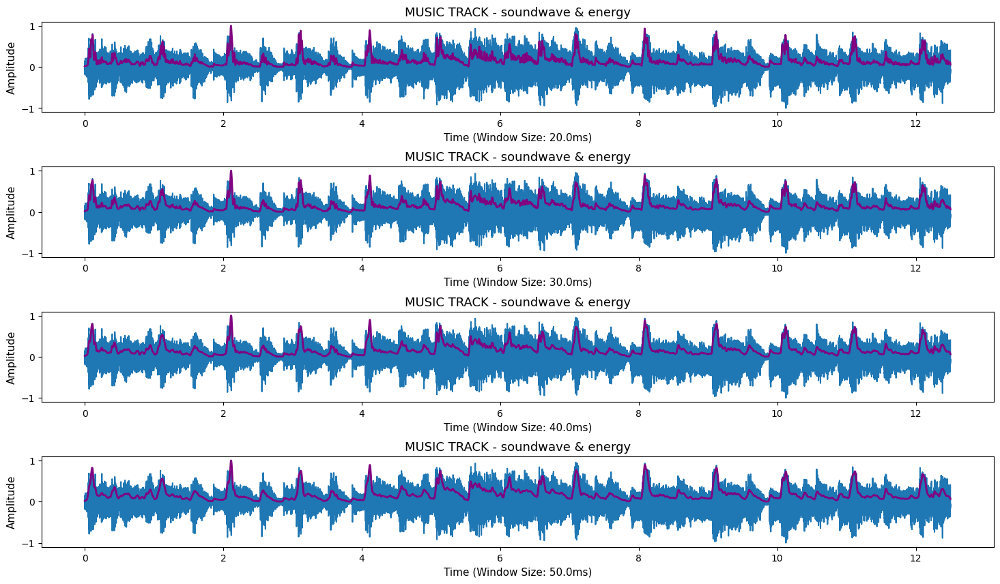

In [ ]:
window_size = [0.02, 0.03, 0.04, 0.05]
music_squared = music*music
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(18, 10))

for size in window_size:
  hamming = np.hamming(size*sample_rate)
  energy = []

  energy = np.convolve(music_squared, hamming, mode='same')
  normalised_energy = energy / np.max(abs(energy))


  axs[window_size.index(size)].plot(time, normalised_music)
  axs[window_size.index(size)].set_title('MUSIC TRACK - soundwave & energy', fontsize=13)
  axs[window_size.index(size)].plot(time, normalised_energy, color="purple", linewidth=2)
  axs[window_size.index(size)].set_ylabel('Amplitude', fontsize=11)
  axs[window_size.index(size)].set_xlabel(f'Time (Window Size: {size*1000}ms)', fontsize=11)
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()



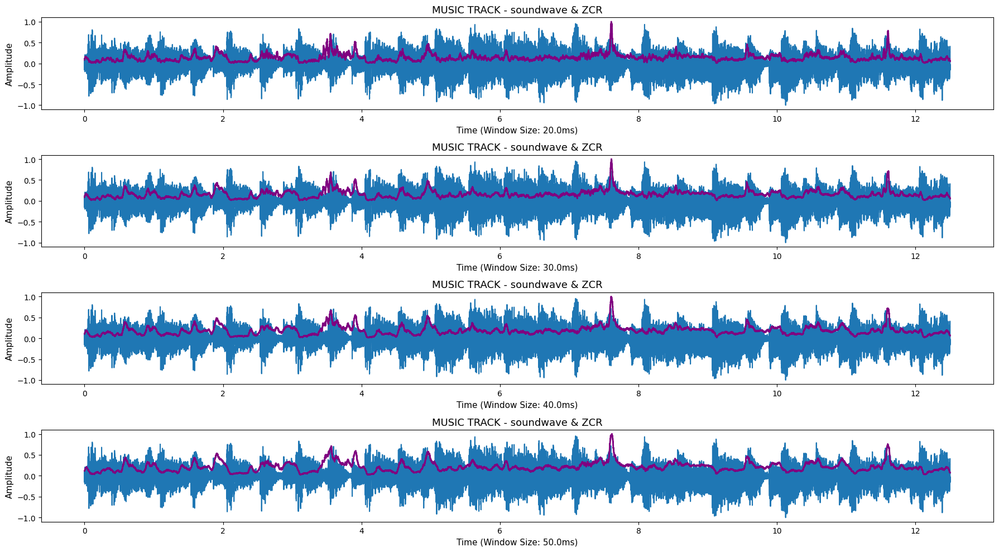

In [ ]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(18, 10))

for size in window_size:
  i = window_size.index(size)
  rect = np.full(int(size*sample_rate), 1/(2*size*sample_rate))
  zcr = []
  music_sign = []
  prev = 0

  for m in music:
    music_sign.append(np.abs(np.sign(m) - np.sign(prev)))
    prev = m

  zcr = np.convolve(music_sign, rect, mode='same')
  zcr_normalised = zcr / np.max(abs(zcr))

  axs[i].plot(time, normalised_music)
  axs[i].set_title('MUSIC TRACK - soundwave & ZCR', fontsize=13)
  axs[i].plot(time, zcr_normalised, color="purple", linewidth=2)
  axs[i].set_ylabel('Amplitude', fontsize=11)
  axs[i].set_xlabel(f'Time (Window Size: {size*1000}ms)', fontsize=11)
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()

SPECTOGRAM MUSIC

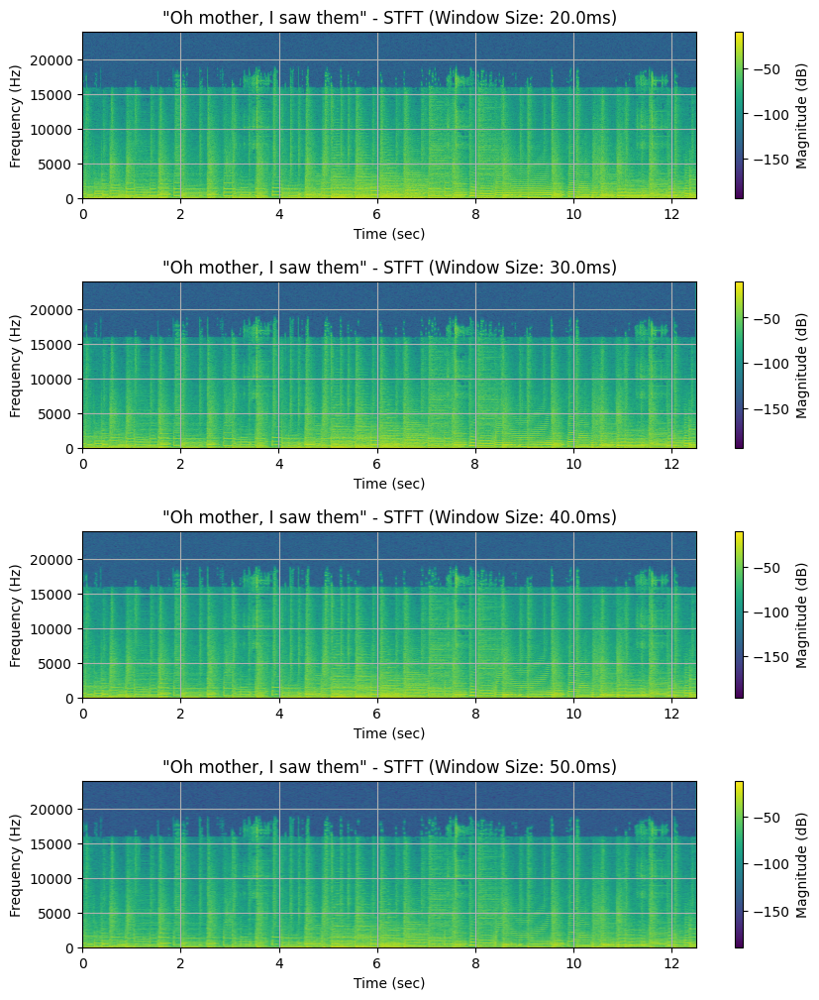

In [ ]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(10, 12))
f = []
t = []
Zxx = []

for size in window_size:
  i = window_size.index(size)
  #Creation and Plotting of STFT
  f1, t1, Zxx1 = stft(music, sample_rate, nperseg=sample_rate*size, nfft=4024) # Ebala 4024 nfft
  f.append(f1)
  t.append(t1)
  Zxx.append(Zxx1)
  mesh = axs[i].pcolormesh(t1,f1, 20*np.log10(np.abs(Zxx1 + 0.00000001)), shading='gouraud')

  #visualisation settings
  cbar = fig.colorbar(mesh, ax=axs[window_size.index(size)])
  cbar.set_label('Magnitude (dB)')  # Set the label for the colorbar
  axs[i].set_title(f'"Oh mother, I saw them" - STFT (Window Size: {size*1000}ms)', fontsize=12)
  axs[i].set_ylabel('Frequency (Hz)', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  plt.subplots_adjust(hspace=0.5)

CENTROID MUSIC

<ipython-input-103-d92ba9a3d739>:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[i].legend()


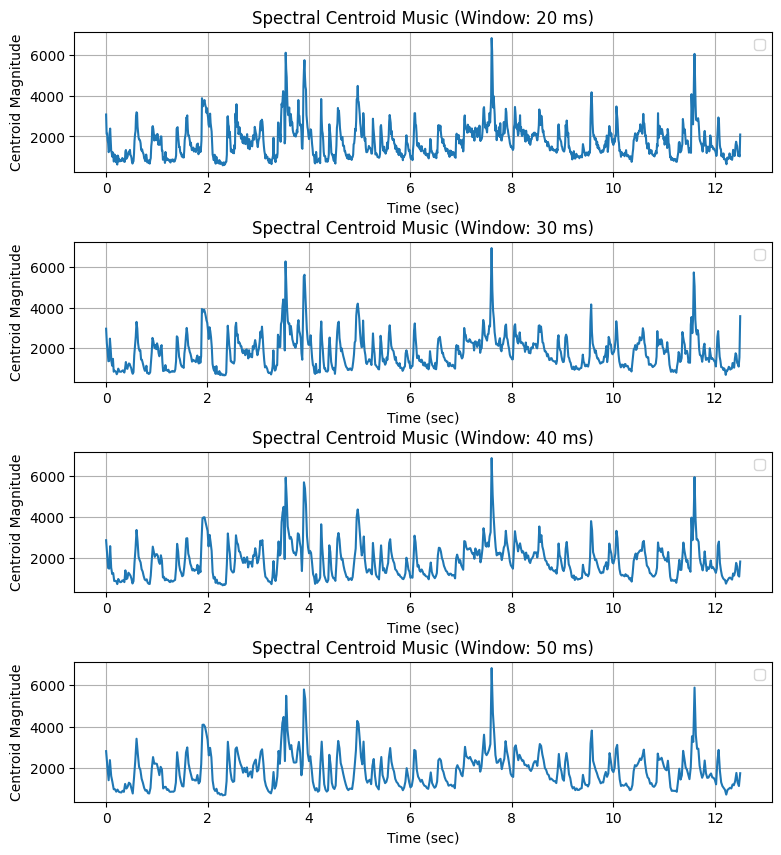

In [ ]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(9, 10))

def spectral_centroid(z, f):
    return np.sum(f * np.abs(z).T, axis = 1) / np.sum(np.abs(z).T, axis = 1)

spec_cent = []

for size in window_size:
    i = window_size.index(size)
    spec_cent.append(spectral_centroid(Zxx[i], f[i]))
    axs[i].plot(t[i], spec_cent[i])
    axs[i].set_title(f'Spectral Centroid Music (Window: {size*1000:.0f} ms)', fontsize = 12)
    axs[i].set_ylabel('Centroid Magnitude', fontsize=10)
    axs[i].set_xlabel('Time (sec)', fontsize=10)
    axs[i].grid()
    axs[i].legend()
    plt.subplots_adjust(hspace=0.5)

SPECTOGRAM AND CENTROID MUSIC

/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


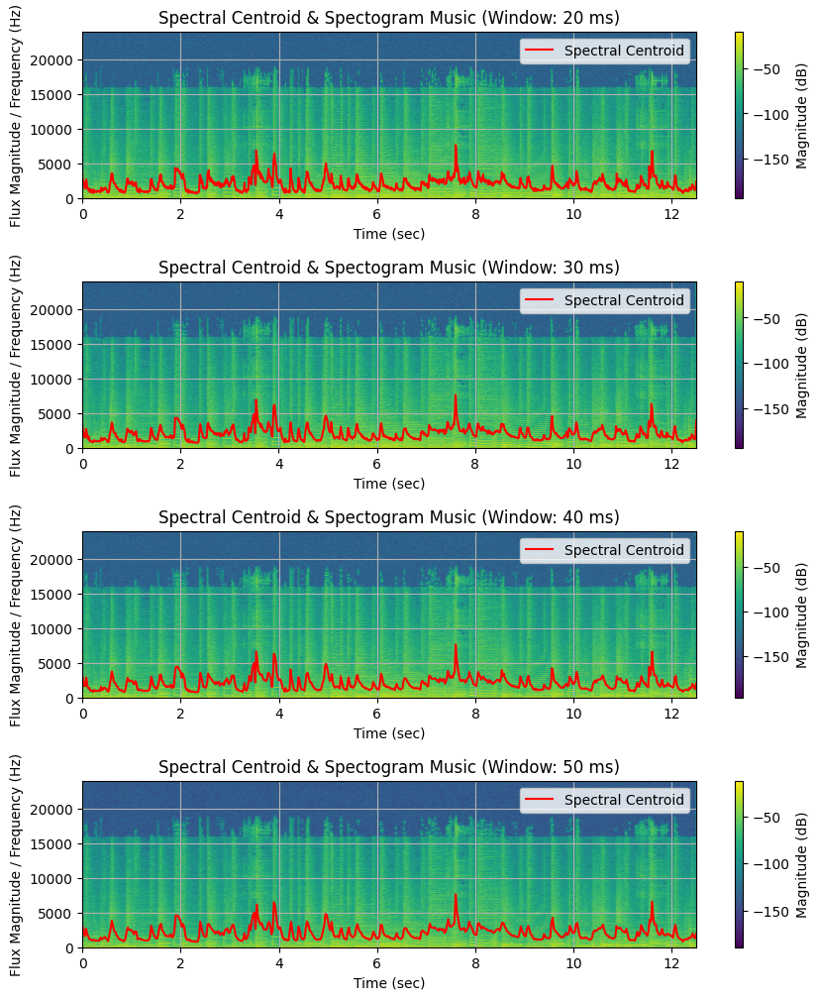

In [ ]:
#ΦΑΣΜΑΤΙΚΟ CENTROID ME SPECTOGRAM
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(10, 12))

for size in window_size:
  # Indexing
  i = window_size.index(size)

  mesh = axs[i].pcolormesh(t[i], f[i], 20*np.log10(np.abs(Zxx[i] + 0.00000001)), shading='gouraud')
  cbar = fig.colorbar(mesh, ax=axs[i])
  cbar.set_label('Magnitude (dB)')

  # Spectral Flux Οπτικοποίηση
  norm_centroid = spec_cent[i] / (1.05*np.max(spec_cent[i]))  # Κανονικοποίηση
  axs[i].plot(t[i], 8000*norm_centroid, color='r', label='Spectral Centroid')
  axs[i].set_title(f'Spectral Centroid & Spectogram Music (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i].set_ylabel('Flux Magnitude / Frequency (Hz)', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  axs[i].legend()
  plt.subplots_adjust(hspace=0.5)

FLUX MUSIC

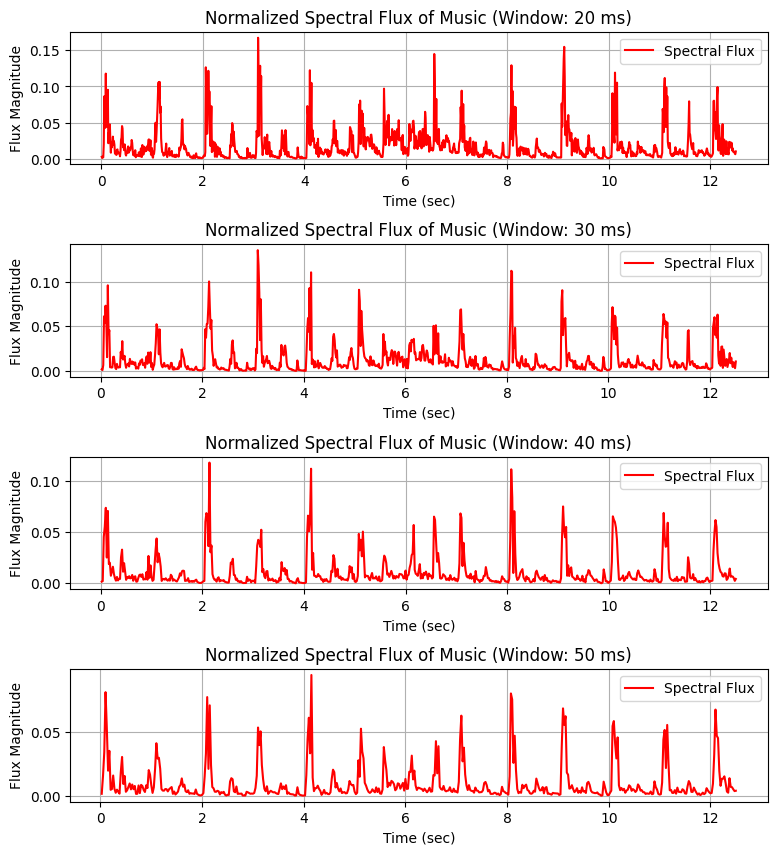

In [ ]:
#ΦΑΣΜΑΤΙΚΗ ΡΟΗ/FLUX ΜΟΝΗ ΤΗΣ
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(9, 10))

flux = []

for size in window_size:
  # Indexing
  i = window_size.index(size)
  # Υπολογισμός φασματικής ροής
  power_spec = np.abs(Zxx[i]) ** 2  # Υπολογισμός φασματικής ενέργειας
  flux.append(np.linalg.norm(power_spec[:, 1:] - power_spec[:, :-1], axis=0))  # Ευκλείδεια απόσταση

  # Spectral Flux Οπτικοποίηση
  axs[i].plot(t[i][1:], flux[i], color='r', label='Spectral Flux')
  axs[i].set_title(f'Normalized Spectral Flux of Music (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i].set_ylabel('Flux Magnitude', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  axs[i].legend()
  plt.subplots_adjust(hspace=0.6)

SPECTOGRAM AND FLUX MUSIC



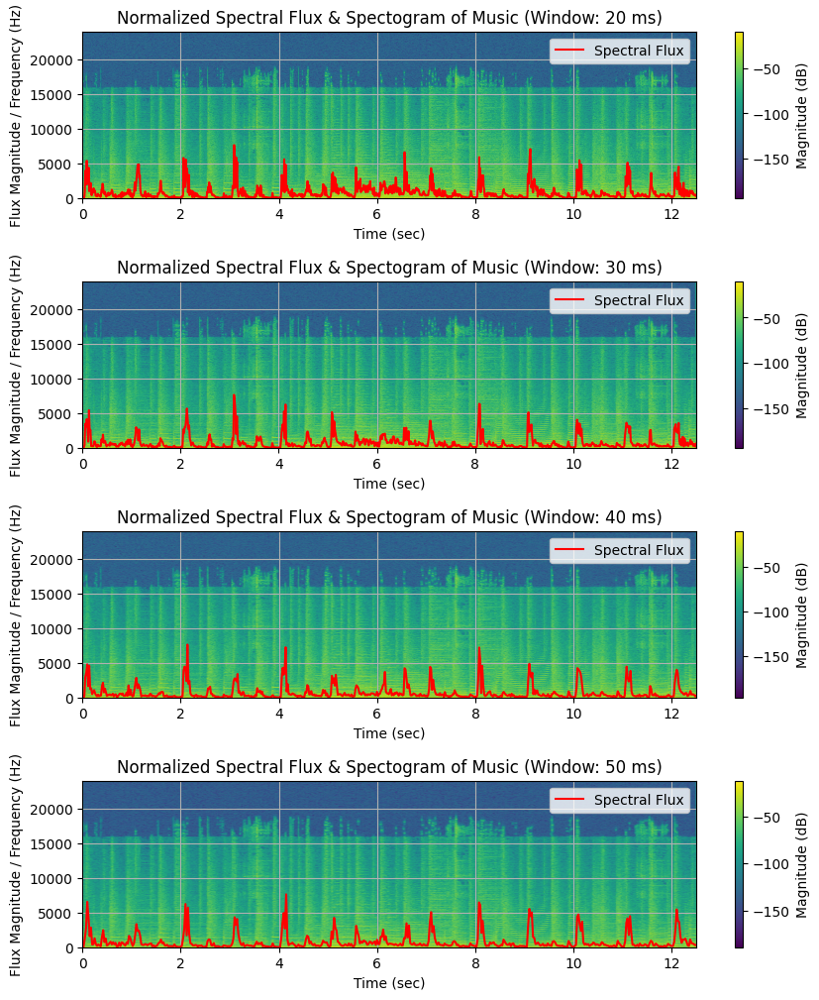

In [ ]:
#ΦΑΣΜΑΤΙΚΗ ΡΟΗ/FLUX ME SPECTOGRAM
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(10, 12))

for size in window_size:
  # Indexing
  i = window_size.index(size)

  mesh = axs[i].pcolormesh(t[i], f[i], 20*np.log10(np.abs(Zxx[i] + 0.00000001)), shading='gouraud')
  cbar = fig.colorbar(mesh, ax=axs[i])
  cbar.set_label('Magnitude (dB)')

  # Spectral Flux Οπτικοποίηση
  norm_flux = flux[i] / (1.05*np.max(flux[i]))  # Κανονικοποίηση
  axs[i].plot(t[i][1:], 8000*norm_flux, color='r', label='Spectral Flux')
  axs[i].set_title(f'Normalized Spectral Flux & Spectogram of Music (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i].set_ylabel('Flux Magnitude / Frequency (Hz)', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  axs[i].legend()
  plt.subplots_adjust(hspace=0.5)

# **Μέρος 3ο - Ψηφιακή Επεξεργασία και Φασματική Ανάλυση Βιοσημάτων Κητωδών**




## Ερώτημα 3.1
---
Φορτώνουμε τα δύο σήματα


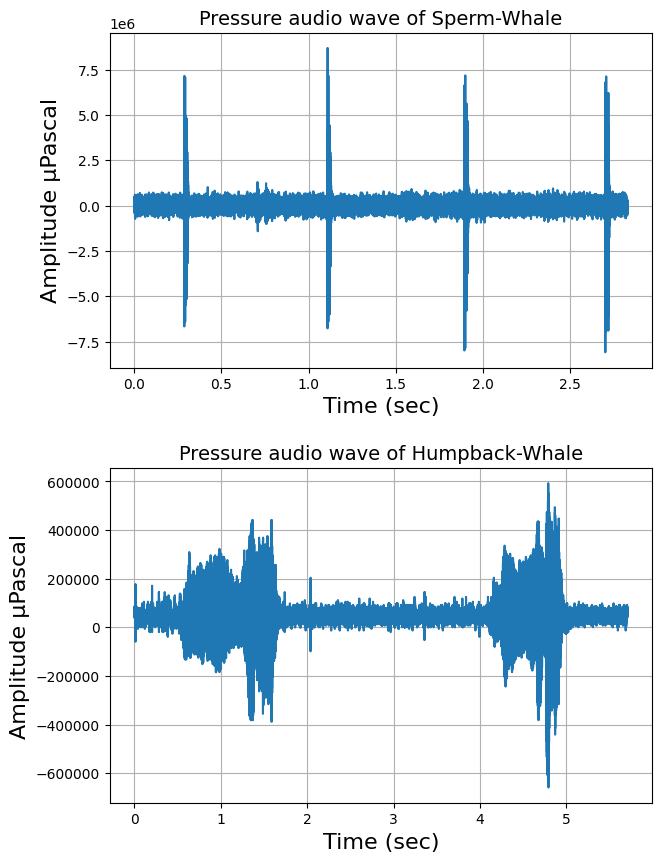

In [ ]:
y_sperm, sr_sperm = librosa.load('85005006.wav', sr = None)
y_hump, sr_hump = librosa.load('9220100Q.wav', sr = None)

def pressure(y):
  GF = 0.16
  sensitivity = -155
  y = (y * 1.5 * GF)/(10**((sensitivity/20)))
  return y


sperm_press = pressure(y_sperm) # σε μPa
hump_press = pressure(y_hump) # σε μPa

time_to_sperm = np.linspace(0, len(sperm_press)/sr_sperm, len(sperm_press))
time_to_hump = np.linspace(0, len(hump_press)/sr_hump, len(hump_press))

fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 10))

axs[0].plot(time_to_sperm, sperm_press)
axs[1].plot(time_to_hump, hump_press)
axs[0].set_title('Pressure audio wave of Sperm-Whale', fontsize=14)
axs[1].set_title('Pressure audio wave of Humpback-Whale', fontsize=14)
plt.subplots_adjust(hspace=0.3)

for i in range(2):
  axs[i].set_ylabel('Amplitude μPascal', fontsize=16)
  axs[i].set_xlabel('Time (sec)', fontsize=16)
  axs[i].grid()


3.2


In [ ]:

prms_sperm = np.sqrt(np.mean(sperm_press**2))
prms_hump = np.sqrt(np.mean(hump_press**2))

p_ref = 1 # μPa
spl_sperm = 20 * np.log10(prms_sperm/p_ref)
spl_hump = 20 * np.log10(prms_hump/p_ref)

print(f'Sperm Whale: PRMS {prms_sperm:.5f} μPa, SPL {spl_sperm:.2f} dB')
print(f'Humpback Whale: PRMS {prms_hump:.5f} μPa, SPL {spl_hump:.2f} dB')

Sperm Whale: PRMS 336416.18750 μPa, SPL 110.54 dB
Humpback Whale: PRMS 83914.95312 μPa, SPL 98.48 dB


3.3


In [ ]:
#For Sperm-Whale
SPERM_PRESS = np.fft.fft(sperm_press) #FFT OF SPERM
Parseval_sperm = np.sum(sperm_press**2)
Parseval_SPERM_FFT = np.sum(abs(SPERM_PRESS)**2)/len(SPERM_PRESS)
print(f'{Parseval_sperm:.0f} = {Parseval_SPERM_FFT:.0f}, deviation is {(Parseval_sperm - Parseval_SPERM_FFT)/Parseval_sperm:.10f} %')

26206092996378624 = 26206095143862272, deviation is -0.0000000819 %


3.4

<ipython-input-5-f129de8416df>:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[i].legend()


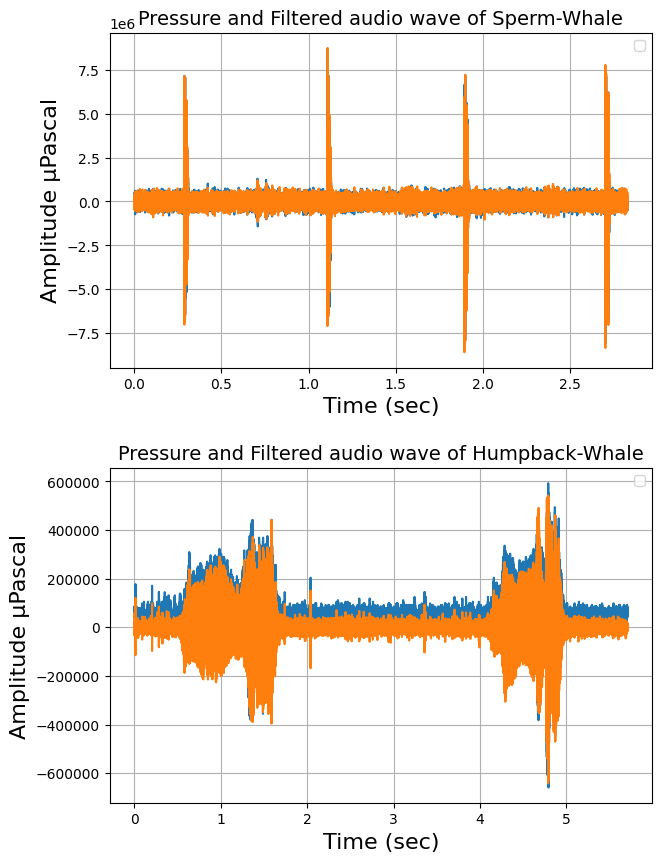

In [ ]:
#kataskeui tou butterworth
cutoff_freq=200 #Hz
N=3

def filtered_butter (y, sr):
  b, a = butter(N, Wn = cutoff_freq, btype = 'high', analog = False, fs = sr)
  y_filtered = lfilter(b, a, y)
  return y_filtered

filtered_sperm = filtered_butter(sperm_press, sr_sperm)
filtered_hump = filtered_butter(hump_press, sr_hump)

fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 10))

axs[0].plot(time_to_sperm, sperm_press)
axs[0].plot(time_to_sperm, filtered_sperm)
axs[1].plot(time_to_hump, hump_press)
axs[1].plot(time_to_hump, filtered_hump)

axs[0].set_title('Pressure and Filtered audio wave of Sperm-Whale', fontsize=14)
axs[1].set_title('Pressure and Filtered audio wave of Humpback-Whale', fontsize=14)
plt.subplots_adjust(hspace=0.3)

for i in range(2):
  axs[i].set_ylabel('Amplitude μPascal', fontsize=16)
  axs[i].set_xlabel('Time (sec)', fontsize=16)
  axs[i].grid()
  axs[i].legend()

3.5


In [ ]:
y_noise, sr_noise = librosa.load('Pile driving.wav')
p_ref = 1
GF = 0.16
sensitivity = -125
noise_press = ( y_noise* 1.5 * GF)/(10**((sensitivity/20)))

prms_noise = np.sqrt(np.mean(noise_press**2))

spl_noise = 20 * np.log10(prms_noise/p_ref)

print('SPL (before filter) is', spl_noise)

if(spl_noise > 100):
  print('😢😢😢😢😢😢😢😢😢😢 HARMFUL FOR SPERM 😢😢😢😢😢😢😢😢😢😢😢')
else:
  print('😊😊😊😊😊😊😊😊😊 NOT HARMFUL FOR SPERM 😊😊😊😊😊😊😊😊😊')

b, a = butter(N ,[300,3000], btype = 'bandpass', fs = sr_noise)
noise_filtered = lfilter(b, a, noise_press)

prms_noise_filtered = np.sqrt(np.mean(noise_filtered**2))
spl_noise_filtered = 20 * np.log10(prms_noise_filtered/p_ref)

print('SPL (after filter) is', spl_noise_filtered)

if(spl_noise_filtered > 100):
  print('😢😢😢😢😢😢😢😢😢😢 HARMFUL FOR HUMPBACK 😢😢😢😢😢😢😢😢😢😢😢')
else:
  print('😊😊😊😊😊😊😊😊😊 NOT HARMFUL FOR HUMPBACK 😊😊😊😊😊😊😊😊😊')





SPL (before filter) is 107.793434
😢😢😢😢😢😢😢😢😢😢 HARMFUL FOR SPERM 😢😢😢😢😢😢😢😢😢😢😢
SPL (after filter) is 84.15848911730171
😊😊😊😊😊😊😊😊😊 NOT HARMFUL FOR HUMPBACK 😊😊😊😊😊😊😊😊😊


3.6

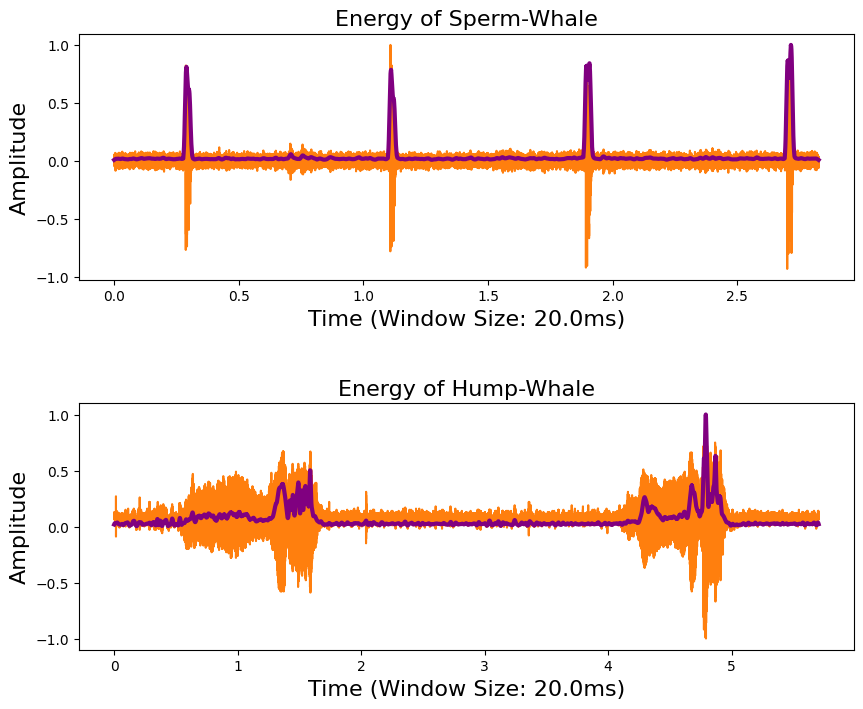

In [ ]:
window_size = 0.02
sperm_squared = y_sperm*y_sperm
hump_squared = y_hump*y_hump

fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

hamming_sperm = np.hamming(window_size*sr_sperm)
hamming_hump = np.hamming(window_size*sr_hump)

energy_sperm = []
enregy_hump = []

energy_sperm = np.convolve(sperm_squared, hamming_sperm, mode='same')
energy_hump = np.convolve(hump_squared, hamming_hump, mode='same')

normalised_sperm = energy_sperm / np.max(abs(energy_sperm))
normalised_hump = energy_hump / np.max(abs(energy_hump))

normalised_press_sperm = sperm_press / np.max(abs(sperm_press))
normalised_press_hump = hump_press / np.max(abs(hump_press))

axs[0].plot(time_to_sperm, normalised_sperm)
axs[0].plot(time_to_sperm, normalised_press_sperm)
axs[1].plot(time_to_hump, normalised_hump)
axs[1].plot(time_to_hump, normalised_press_hump)

axs[0].set_title('Energy of Sperm-Whale', fontsize=16)
axs[1].set_title('Energy of Hump-Whale', fontsize=16)
axs[0].plot(time_to_sperm, normalised_sperm, color="purple", linewidth=3)
axs[1].plot(time_to_hump, normalised_hump, color="purple", linewidth=3)
axs[0].set_ylabel('Amplitude', fontsize=16)
axs[1].set_ylabel('Amplitude', fontsize=16)
axs[0].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
axs[1].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
plt.subplots_adjust(hspace=0.5)

3.7

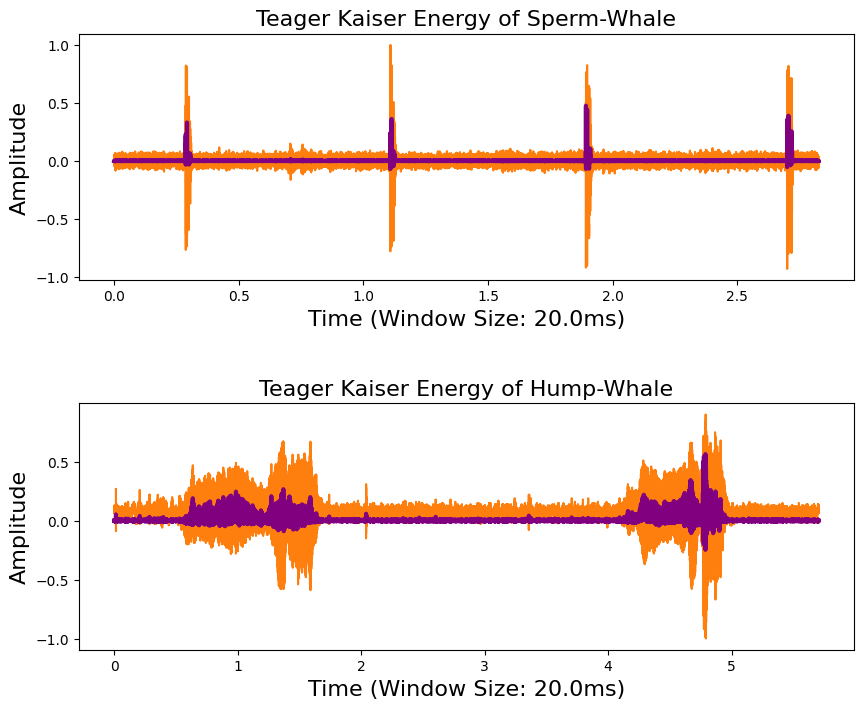

In [ ]:
def teager_kaiser(p):
  length_p=len(p)
  teager_kaiser=[]
  for i in range(0, length_p):
    if i==0:
      teager_kaiser.append(p[i]**2-p[i]*p[i+1])
    elif i==length_p-1:
      teager_kaiser.append(p[i]**2-p[i-1]*p[i])
    else:
      teager_kaiser.append(p[i]**2-p[i-1]*p[i+1])
  return teager_kaiser

fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

teager_kaiser_sperm = teager_kaiser(normalised_press_sperm)
teager_kaiser_hump = teager_kaiser(normalised_press_hump)

axs[0].plot(time_to_sperm, teager_kaiser_sperm)
axs[0].plot(time_to_sperm, normalised_press_sperm)
axs[1].plot(time_to_hump, teager_kaiser_hump)
axs[1].plot(time_to_hump, normalised_press_hump)

axs[0].set_title('Teager Kaiser Energy of Sperm-Whale', fontsize=16)
axs[1].set_title('Teager Kaiser Energy of Hump-Whale', fontsize=16)
axs[0].plot(time_to_sperm, teager_kaiser_sperm, color="purple", linewidth=3)
axs[1].plot(time_to_hump, teager_kaiser_hump, color="purple", linewidth=3)
axs[0].set_ylabel('Amplitude', fontsize=16)
axs[1].set_ylabel('Amplitude', fontsize=16)
axs[0].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
axs[1].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
plt.subplots_adjust(hspace=0.5)

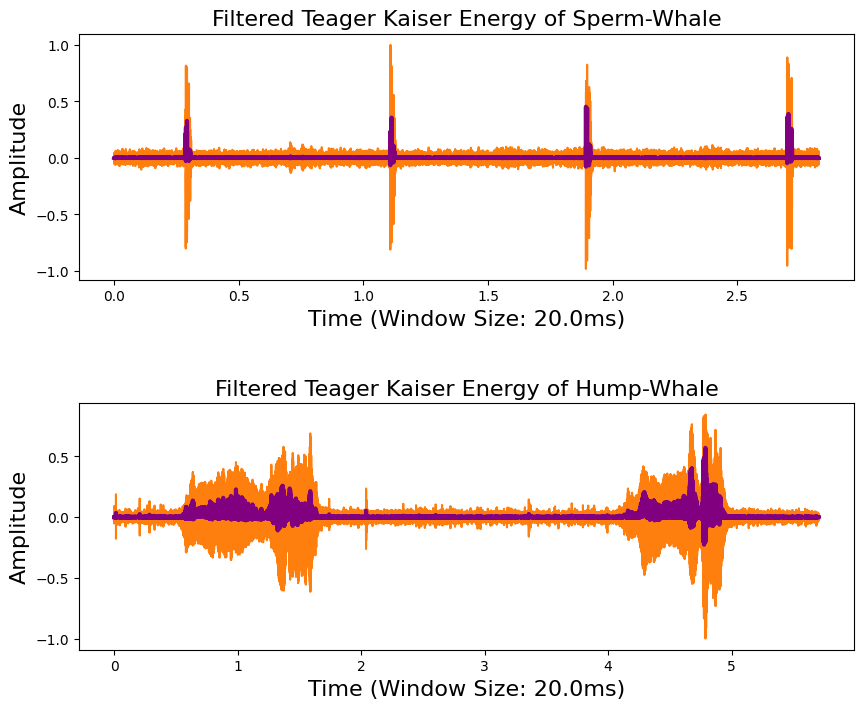

In [ ]:
fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

normalised_filtered_sperm = filtered_sperm/np.max(abs(filtered_sperm))
normalised_filtered_hump = filtered_hump/np.max(abs(filtered_hump))

teager_kaiser_sperm = teager_kaiser(normalised_filtered_sperm)
teager_kaiser_hump = teager_kaiser(normalised_filtered_hump)

axs[0].plot(time_to_sperm, teager_kaiser_sperm)
axs[0].plot(time_to_sperm, normalised_filtered_sperm)
axs[1].plot(time_to_hump, teager_kaiser_hump)
axs[1].plot(time_to_hump, normalised_filtered_hump)

axs[0].set_title('Filtered Teager Kaiser Energy of Sperm-Whale', fontsize=16)
axs[1].set_title('Filtered Teager Kaiser Energy of Hump-Whale', fontsize=16)
axs[0].plot(time_to_sperm, teager_kaiser_sperm, color="purple", linewidth=3)
axs[1].plot(time_to_hump, teager_kaiser_hump, color="purple", linewidth=3)
axs[0].set_ylabel('Amplitude', fontsize=16)
axs[1].set_ylabel('Amplitude', fontsize=16)
axs[0].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
axs[1].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
plt.subplots_adjust(hspace=0.5)

3.8 (σπερμοφάλαινα)


Text(0.5, 1.0, 'Welch Diagram in semi-logarithmic scale for Sperm Whale')

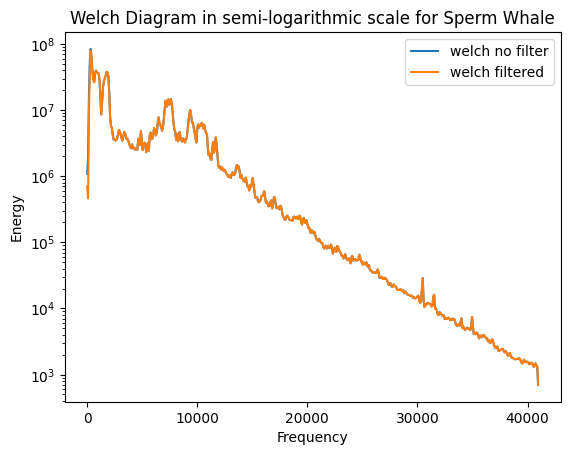

In [ ]:
welsh_sperm, sperm_den = sc.welch(sperm_press, sr_sperm, nperseg=1024)
plt.semilogy(welsh_sperm, sperm_den, label='welch no filter')

welsh_sperm_filt, sperm_den_filt = sc.welch(filtered_sperm, sr_sperm, nperseg=1024)
plt.semilogy(welsh_sperm_filt, sperm_den_filt, label='welch filtered')
plt.legend()
plt.ylabel('Energy')
plt.xlabel('Frequency')
plt.title('Welch Diagram in semi-logarithmic scale for Sperm Whale')

τριβοφάλαινα


Text(0.5, 1.0, 'Welch Diagram in semi-logarithmic scale for Humpback Whale')

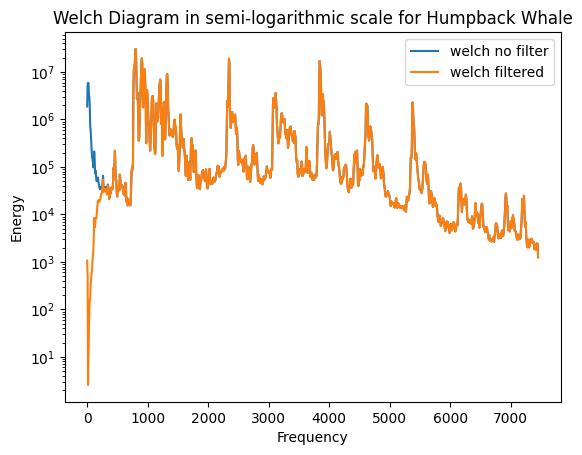

In [ ]:
welsh_hump, hump_den = sc.welch(hump_press, sr_hump, nperseg=2048)
plt.semilogy(welsh_hump, hump_den, label='welch no filter')

welsh_hump_filt, hump_den_filt = sc.welch(filtered_hump, sr_hump, nperseg=2048)
plt.semilogy(welsh_hump_filt, hump_den_filt, label='welch filtered')
plt.legend()
plt.ylabel('Energy')
plt.xlabel('Frequency')
plt.title('Welch Diagram in semi-logarithmic scale for Humpback Whale')

3.9

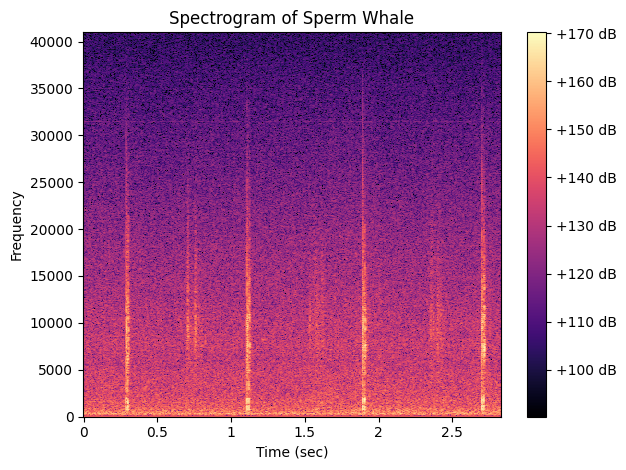

In [ ]:
fourier_sperm = abs(librosa.stft(sperm_press))
f_db_sperm = librosa.amplitude_to_db(fourier_sperm)
librosa.display.specshow(f_db_sperm, sr = sr_sperm, x_axis='time', y_axis='hz')

plt.ylabel('Frequency')
plt.xlabel('Time (sec)')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Sperm Whale')
plt.tight_layout()


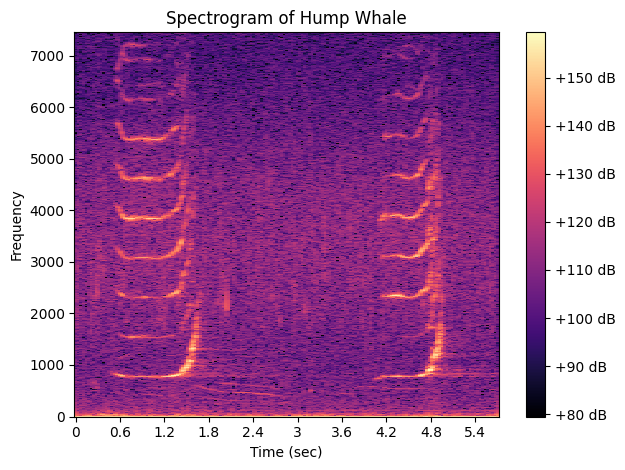

In [ ]:
fourier_hump = librosa.stft(hump_press)

f_db_hump = librosa.amplitude_to_db(np.abs(fourier_hump))


librosa.display.specshow(f_db_hump, sr = sr_hump, x_axis='time', y_axis='hz')
plt.ylabel('Frequency')
plt.xlabel('Time (sec)')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Hump Whale')
plt.tight_layout()


3.10

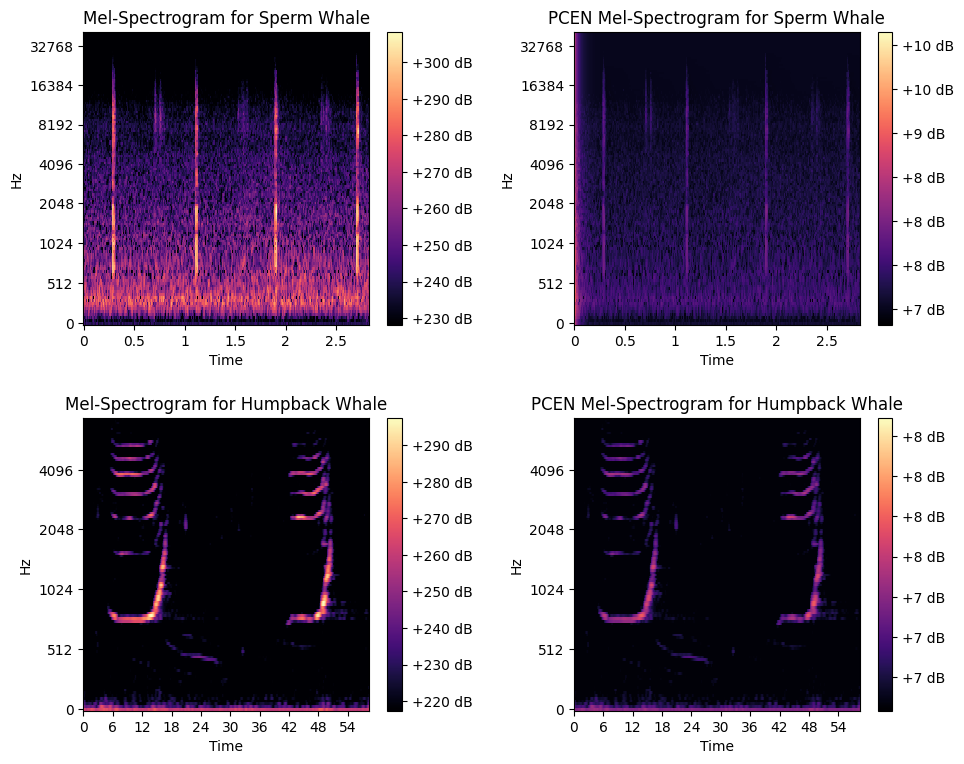

In [ ]:
fig,axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

mel_sperm= librosa.feature.melspectrogram(y=sperm_press, sr = sr_sperm)
mel_db_sperm = librosa.amplitude_to_db(mel_sperm)
pcen_mel_sperm=librosa.pcen(mel_db_sperm, sr = sr_sperm, gain = 0.25, bias=0.5, time_constant=0.03, hop_length = 256)

plt.subplot(2, 2, 1)
librosa.display.specshow(mel_db_sperm,sr = sr_sperm, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-Spectrogram for Sperm Whale')

plt.subplot(2, 2, 2)
librosa.display.specshow(pcen_mel_sperm,sr =sr_sperm, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('PCEN Mel-Spectrogram for Sperm Whale')

mel_hump = librosa.feature.melspectrogram(y=hump_press, sr = sr_hump, hop_length = 50)
mel_db_hump = librosa.amplitude_to_db(mel_hump)
pcen_mel_hump = librosa.pcen(mel_db_hump, sr = sr_hump, gain = 0.25, bias=0.5, time_constant=0.03, hop_length = 256)

plt.subplot(2, 2, 3)
librosa.display.specshow(mel_db_hump,sr =sr_hump,  x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-Spectrogram for Humpback Whale')

plt.subplot(2, 2, 4)
librosa.display.specshow(pcen_mel_hump, sr = sr_hump, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('PCEN Mel-Spectrogram for Humpback Whale')

plt.tight_layout(pad=2.0)